## Final Project Week 3 (Lab partner: Percy Nizamova)
### *Summary: For this week, we went crazy with our new integrated circuit, the ICL8083. We set up the chip, and progressly added things to the basic circuit, improving the shape of the sine wave, allowing for frequency modulation, and allowing for amplitude modulation.*
- For this week, we are experimenting with the ICL8038 integrated circuit. This chip requires a steady DC supply voltage, and gives a square wave, triangle wave, and sine wave siultaneously on three different pins. It also has pins for controlling the frequency based on voltage, and the duty cycle.
- First, we decided to built one of the simplest circuits you could build with the chip, just to test the shapes of the waves output. This circuit does not include functionality for changing the frequency easily, but we can add potentiometers to add this functionality later. Below is a screenshot of the pin diagram and this first simple circuit we aim to build, both from the ICL8038's datasheet.

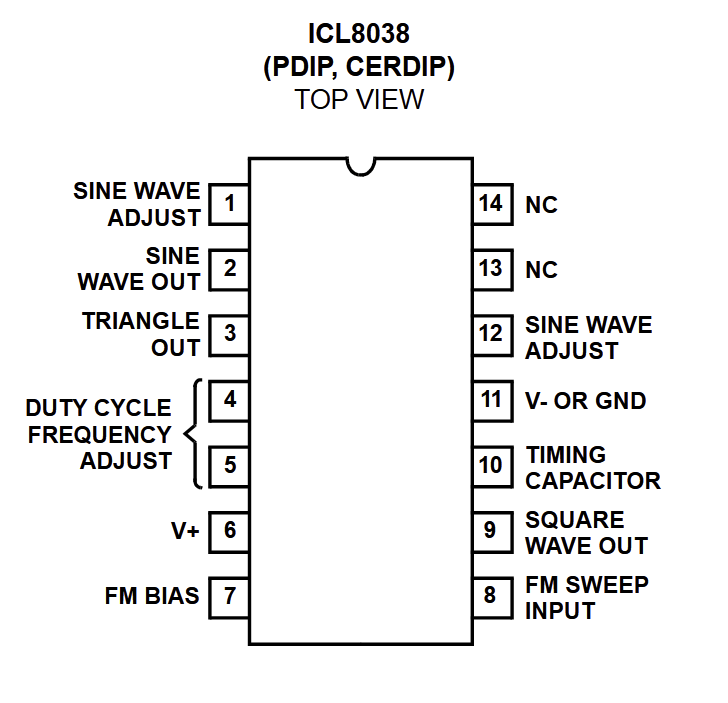

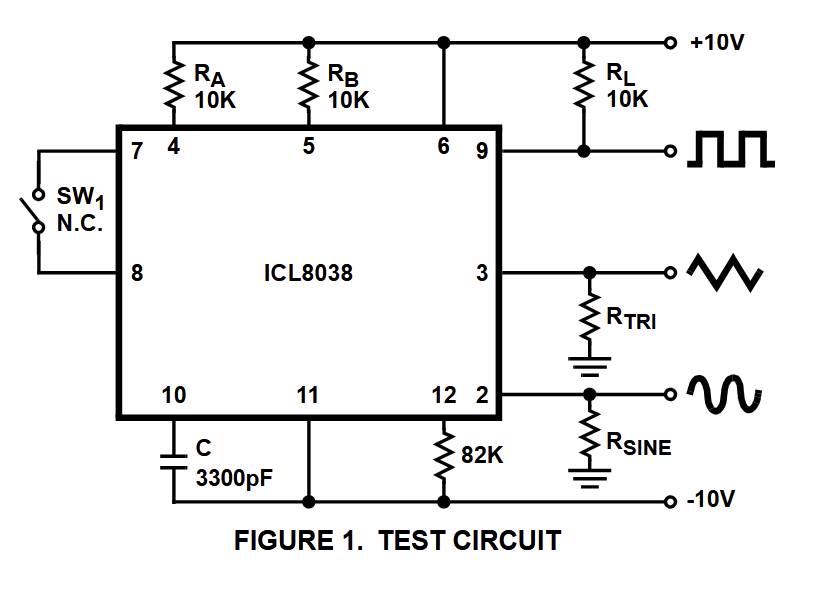

- In this test circuit, we reasoned that the R_tri and R_sine, which were the only component values not given, were effectively the resistors inside the scope, once we connected the output to the scope to see the waveforms. Because of this, we didn't explicitly include these resistors. We collected all the other components parts and built the test circuit.
- With everything set up, we decided to first view the square wave output on the scope. Connecting the 10x probe to pin 9 of the chip, we saw the following.

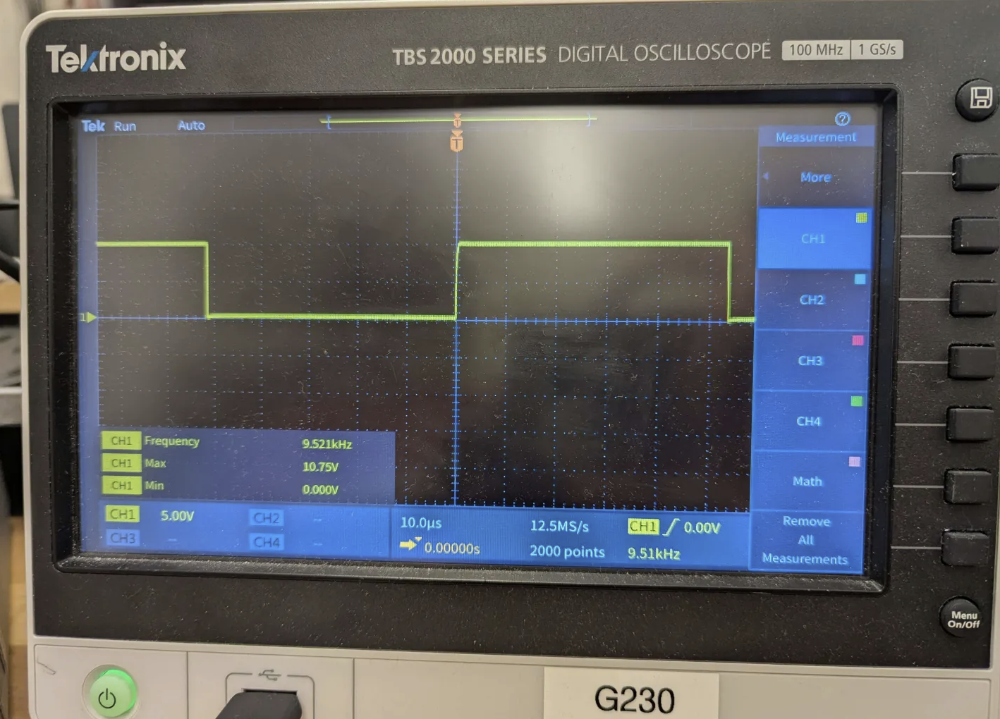

- This square wave is of a quite decent shape, with a 51% duty cycle (theoretical was 50%). This small difference in duty cycle was most likely caused by $R_A$ and $R_B$ having slightly different values (they are obviously not exactly 10kΩ—RA is 9.97kΩ, RB is 9.98kΩ). The frequency is about 9.57kHz. Min voltage was 0V, and the max was 10.75V.
- Next, we wanted to display the triangle wave. Below is what showed on the scope.

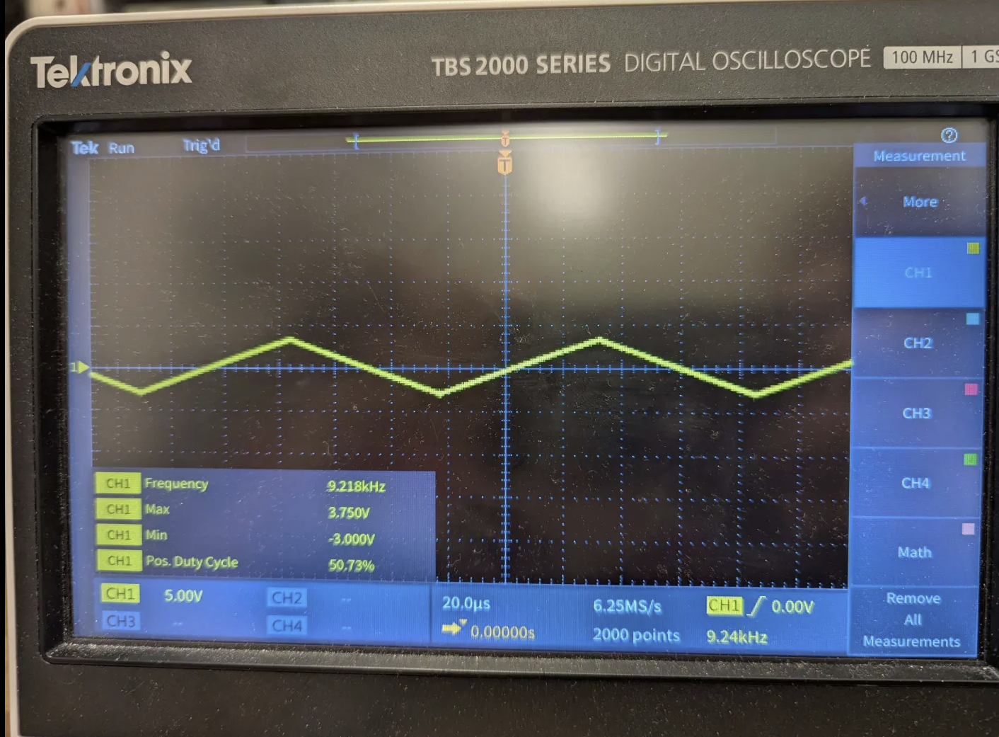

- This triangle wave has a very nice shape, but the max and min voltage is a bit different (3.24V vs. -3.06V, found using cursors on the scope). The frequency is about 9.273 Hz. There was also some small distortion at the peaks and troughs, with a sort of vertical line at the point where the positive and negative slopes met.

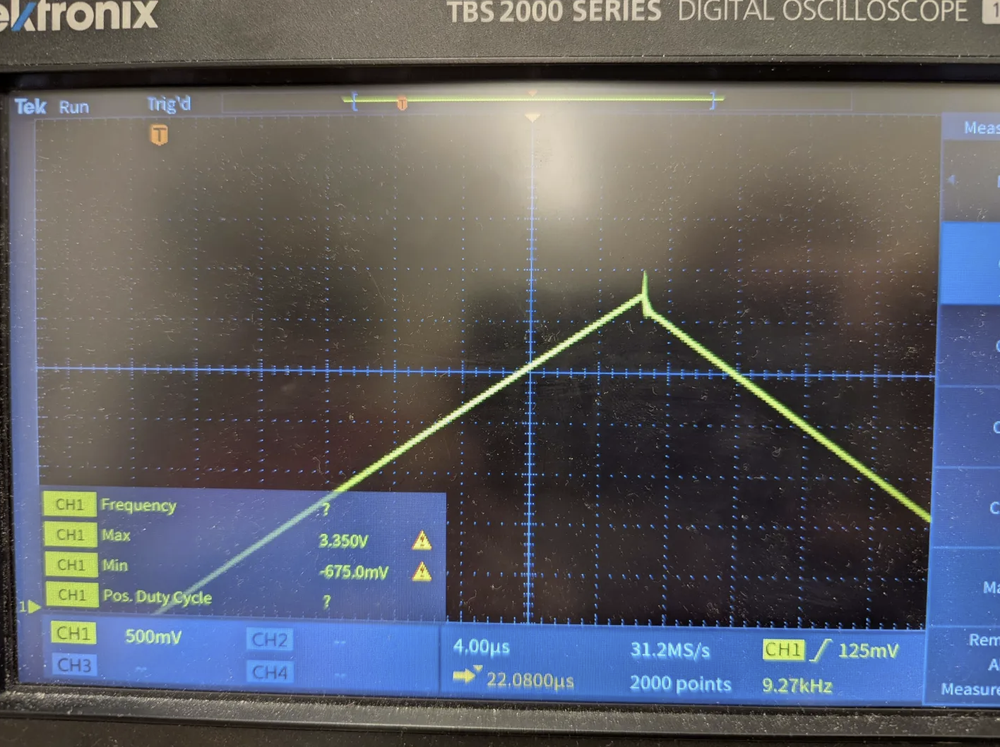

- Last (for this test circuit), we hooked up the sine wave output to the scope. Below was the display.

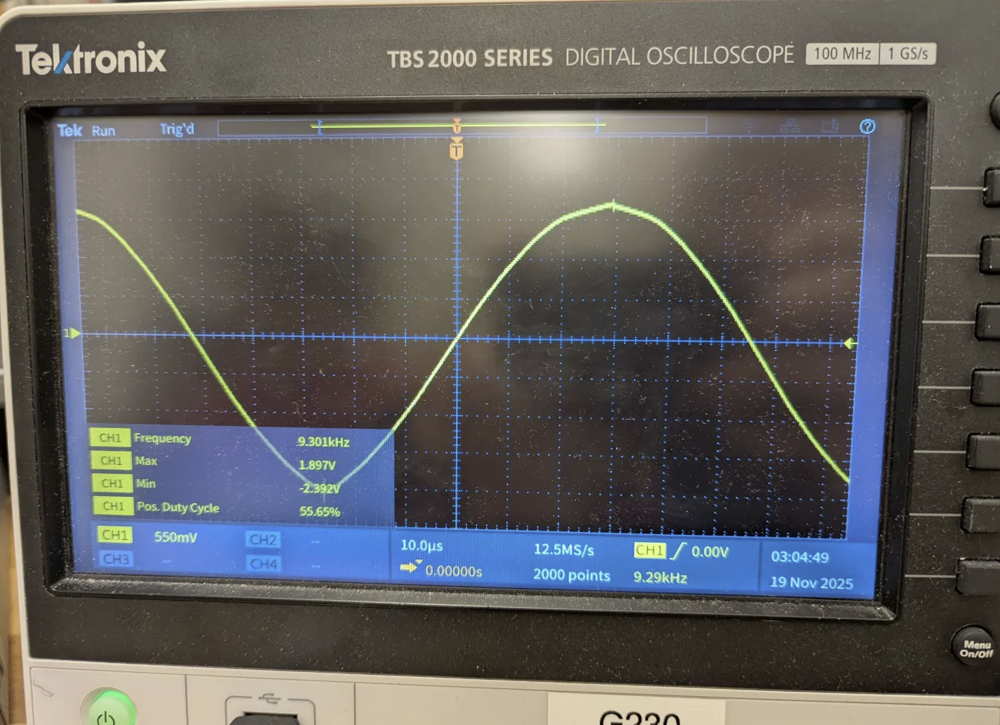

- The shape is alright, but there is obvious distortion/inacurracy. The sine wave inherents the distortions at the peaks/troughs from the triangle wave, but also has shape distortions, with the bottom part of the wave being two steep/"spiky," and the top part looking like a linear piecewise function (not smooth enough). The frequency was basically the same as the triangle, and the max and min had a greater discrepancy (1.94V vs. -2.39V).
- We decided for our next step to attempt to decrease distortion of the sine wave, using a slightly altered, slightly more complex circuit which also has a diagram to reference in the datasheet. This, according to the datasheet, implements multiple potentiometers which should be able to be fine-tuned to decrease the sine wave distortion as much as possible.

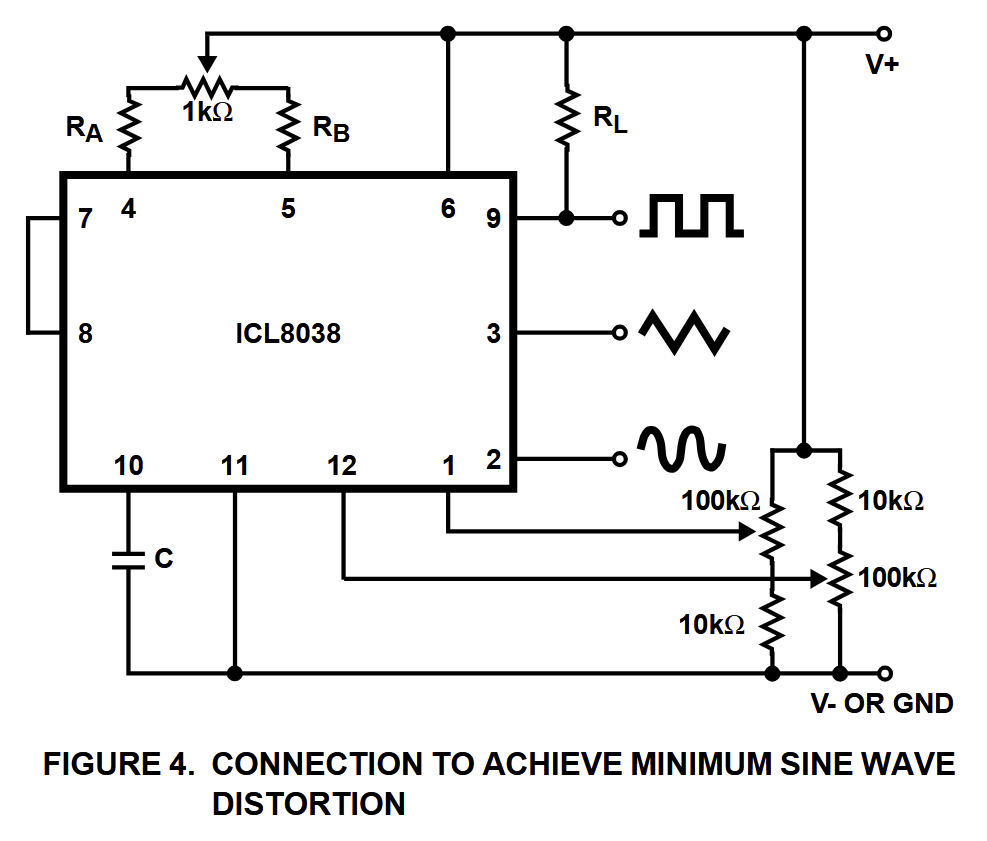

- The datasheet also has a diagram for a simpler circuit with fewer pots, but that one is not able to eliminate distortion as well as this more complicated circuit. So, we made the circuit. Praying that we wired everything correctly, and with the pin 12 pot set to roughly 82kΩ, the other 100k pot set to roughly 50kΩ, and the 1k pot set to roughly 500Ω, we gave the new circuit its required inputs and viewed it on the scope.
- The square wave was nearly the same, but had slight distortion at the beginning of the portion of the wave at 0V. The triangle wave looked even better, with virtually zero of the distortion we had seen previously. The sine wave looked noticably better, and the distortion at the peaks and troughs was also virtually gone, but it was still noticably not smooth enough upon zooming in.
#### 11/23
- For this second day, we wanted to first tweak the sine wave to have as little distortion as possible, using the three pots we added to the circuit. Tweaking either of the two 100kΩ pots seemed to improve the bottom part of the wave while distorting the top (basically, turning one way made the top more angular/piecewise-linear-looking and the bottom more spiky-looking). Turns of the pots also shifted the whole wave up and down a bit. So, we played with them a bit, aiming to get the top and bottom to have the least distortion, with the max and min voltages being nearly identical. Then, we added a sine wave with a very similar frequency and similar Vpp amplitude to another channel of the scope, made by the good function generator that we have in lab. Below is a picture of these two waves next to each other.

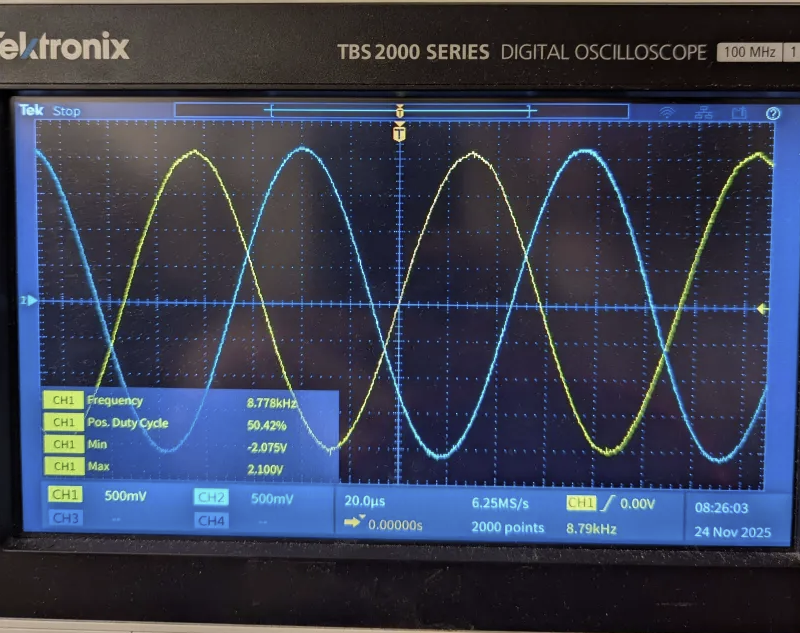

- After tweaking our sine wave to be as accurate as possible, we decided that the next step was to implement an easy frequency modulation system. Thankfully, with this chip, there are dedicated pins for a voltage-based frequency modulation! According to the datasheet, we can get large frequency modulation by applying a voltage to pin 8 directly. The datasheet claims the normal use range for this voltage should be, at the high end, just less than +V (which is +10V for this current circuit), and just above $+V - \frac{1}{3}V_{supply}-2V$ on the low end, where Vsupply is the total range of the supply voltage (20V for this circuit). So, the voltage applied to pin 8 to modulate the frequency can only range from +10V on the high end, to +4.66V on the low end, though it should not ever quite equal these bounds (should always lie between them).
- To test this frequency modulation out, we connected up another power supply to our breadboard to supply this voltage directly to pin 8 of the chip. Below is a picture of the scope near the minimum applied voltage (4.67V):

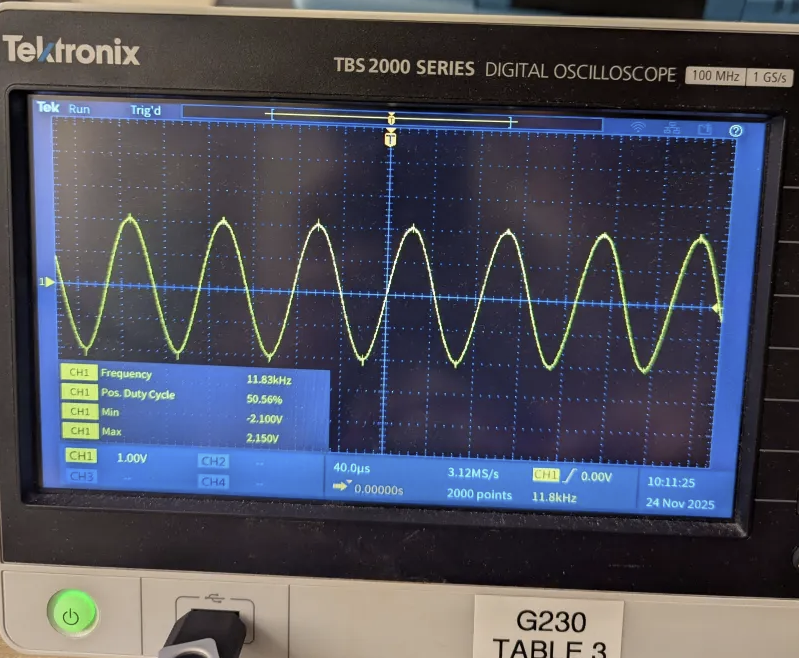

- Below is a picture of the scope at a middle voltage (8V):

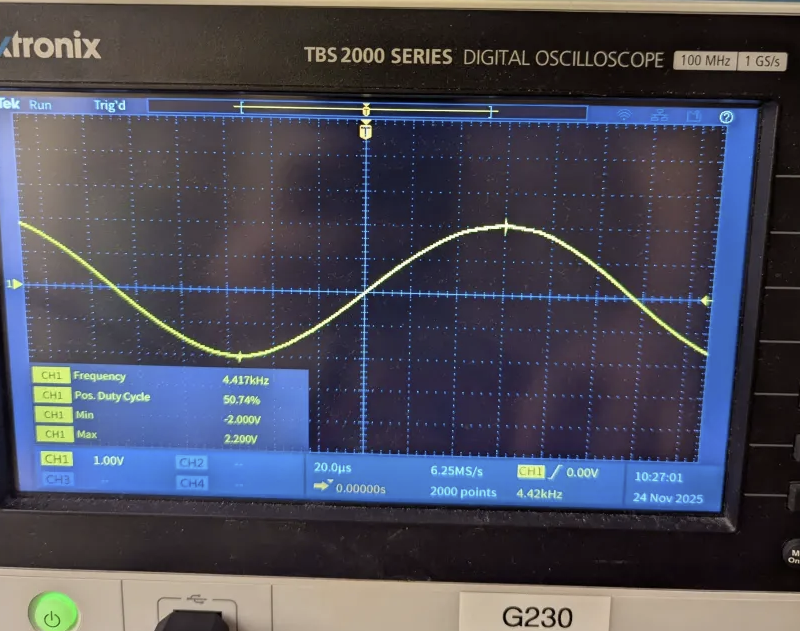

- Below is a picture of the scope near the max voltage (9.958V):

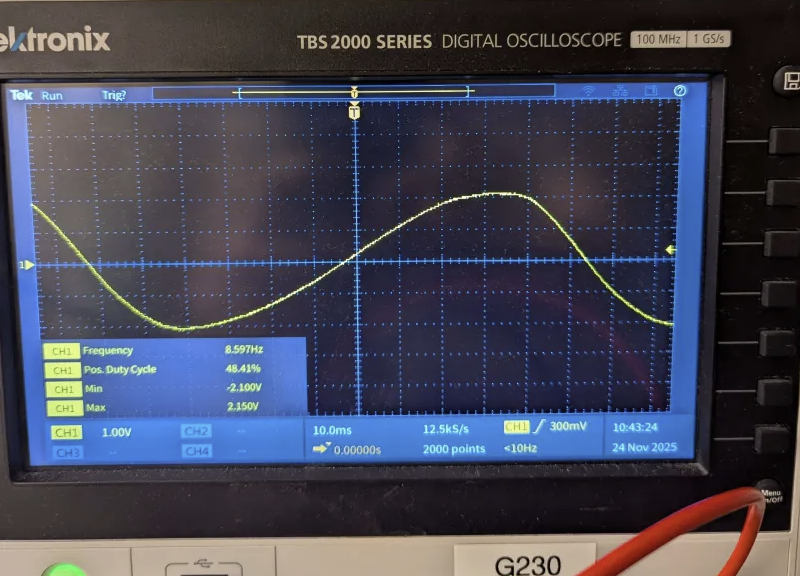

- Below is a table of the values we tested, along with the resultant frequencies we got on the scope, using the measure tool.

|Pin 8 Voltage (V) |Frequency (Hz) |
|----|----|
|4.67 |11,960 |
|5.00 |11,220 |
|5.50 |10,080 |
|6.00 |8,967 |
|6.50 |7,832 |
|7.00 |6,699 |
|7.50 |5,560 |
|8.00 |4,423 |
|8.50 |3,286 |
|9.00 |2,158 |
|9.50 |1,032 |
|9.70 |582.7 |
|9.80 |359.1 |
|9.90 |140.1 |
|9.958 |12.62 |

- Below is a plot of the data.

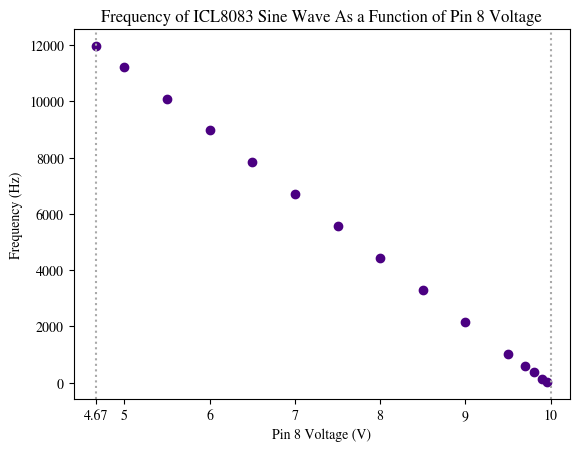

In [21]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib

data = np.array([
    [4.67, 11960],
    [5.00, 11220],
    [5.50, 10080],
    [6.00, 8967],
    [6.50, 7832],
    [7.00, 6699],
    [7.50, 5560],
    [8.00, 4423],
    [8.50, 3286],
    [9.00, 2158],
    [9.50, 1032],
    [9.70, 582.7],
    [9.80, 359.1],
    [9.90, 140.1],
    [9.958, 12.62]
])

matplotlib.rcParams['mathtext.fontset'] = 'cm'
matplotlib.rcParams['font.family'] = 'STIXGeneral'

plt.xlabel('Pin 8 Voltage (V)')
plt.ylabel('Frequency (Hz)')
plt.scatter(data[:,0], data[:,1], color='indigo')
plt.title('Frequency of ICL8083 Sine Wave As a Function of Pin 8 Voltage')
# plt.grid(axis='both', linestyle='dotted')
plt.axvline(x=4.67, color='darkgray', linestyle=':')
plt.axvline(x=10, color='darkgray', linestyle=':')

plt.xticks([4.67, 5, 6, 7, 8, 9, 10], ['4.67', '5', '6', '7', '8', '9', '10'])

plt.show()

- As we turned the voltage up, it seemed that the frequency went to 0 quicker and quicker. Clearly, by the plot this is not true (the relationship is almost *perfectly* linear!), and the extra data points near the max voltage were not necessary. When the voltage increases by some amount $\Delta V$, the frequency decreases by some fixed amount (the definition of linear); however, the percentage decrease gets larger in magnitude, which is why we thought getting multiple data points near the max voltage would be useful.
#### 11/27 and 11/30
- So far, we've made a basic circuit with the ICL8083 chip, which produces a square wave, a triange wave, and a sine wave. We added stuff to our circuit to decrease the distortion of the sine wave output, following the datasheet. Then, we added functionality for frequency modulation at the turn of a knob by connecting pin 8 to another power supply and changing the voltage supplied. To wrap up this week, we want to add a voltage gain stage to the output of our chip, with variable gain.
- Once again, the datasheet provides a circuit as a guide, since this variable voltage amplitude is a common thing to want from this chip. What follows is this circuit.
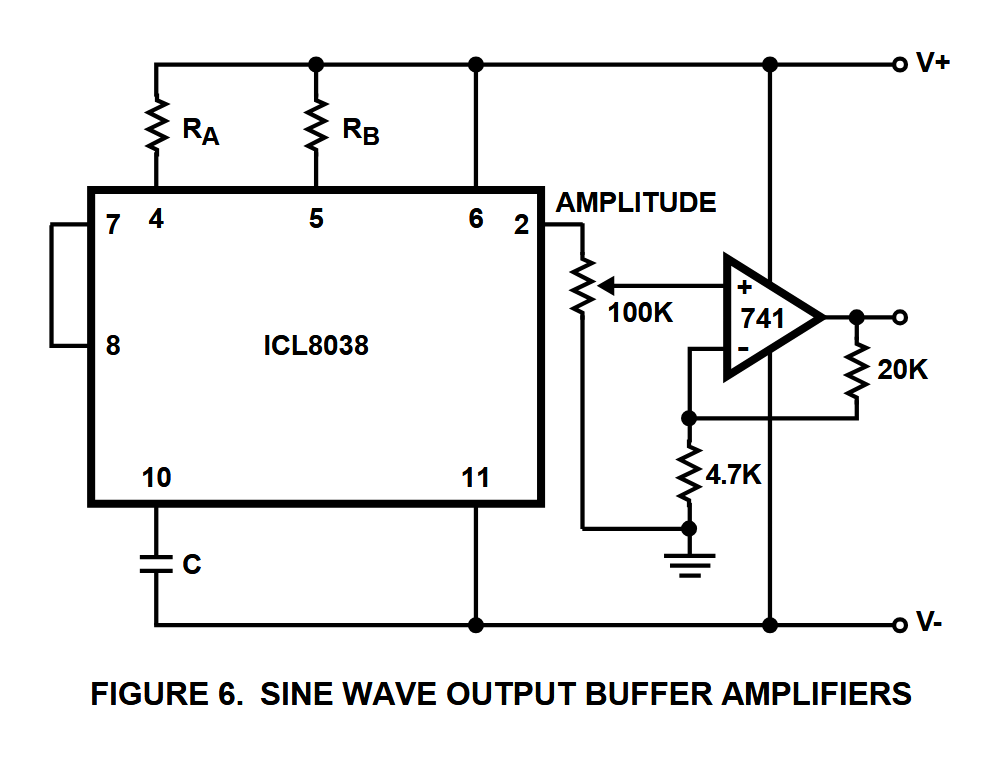
- Of course, our current circuit includes all of the potentiometers to reduce sine wave distortion, as well as variable voltage being supplied to pin 8 for frequency modulation. Using this circuit diagram as a guide, we added this adjustable non-inverting amplifier to the sine wave output of our ICL8083 circuit (we used an LF356 op-amp). Below are a few data points to give a decent gauge of how the added potentiometer controls the gain/amplification.

| Potentiometer (resistance from ICL8083 sine output to op-amp pin 3) (kΩ) | Op-amp $V_{in}$ (Vpp) | Approx. Gain of op-amp |
|------------------|--------------------|------------------|
| 86.0             | 0.3950             | 2.050/0.3950 = 5.190 |
| 77.4             | 0.7750             | 4.025/0.7750 = 5.194 |
| 68.6             | 1.130              | 6.000/1.130 = 5.310 |
| 60.35            | 1.550              | 8.000/1.550 = 5.161 |

- To make these measurements, we adjusted the potentiometer knob until the scope showed the peak-to-peak voltage we were looking for (this was the output voltage, appearing in the numerator of the approx. gain calculation). Then, we put the probe to pin 3 of the op amp to measure the input voltage. Last, we carefully pulled the pot out of our circuit and measured the resistance we needed with the DMM. We should expect the gain of the op amp stage to remain roughly constant, as we aren't changing any of the resistors that would change the gain of the amplifier, just the input voltage for the amplifier. And this is what we see, a roughly constant gain!
- The way that this variable gain stage works is that the gain of the op amp stays approximately the same, while the user controls the input voltage at pin 3 using the potentiometer as a voltage divider. So, the transfer function is $\frac{R_2}{R_p}=\frac{R_p-R_1}{R_p}$ (where R1 is the resistance from the ICL chip to the op amp, and R2 is the resistance from the op amp to ground; R1 + R2 = Rp, the total resistance 100kΩ of the pot), resulting in a theoretically direct linear relationship between the voltage at pin 3 of the op amp and the position of the potentiometer knob. This also means that the theoretical max voltage at pin 3 should be when this transfer function is at its maximum (which is one), resulting in a max voltage of the peak-to-peak of the sine output of the ICL chip, resulting in a final wave with a peak-to-peak of roughly 5.2 times this (since the gain of the op amp is about 5.2). Also, the theoretical min voltage at pin 3 should be 0 (when the transfer function is zero), resulting in a final wave with zero amplitude. We verified each of these edge cases, but saw that the saturation voltage of the op amp cut off the higher end of the amplitude range, resulting in clipping, shown below:

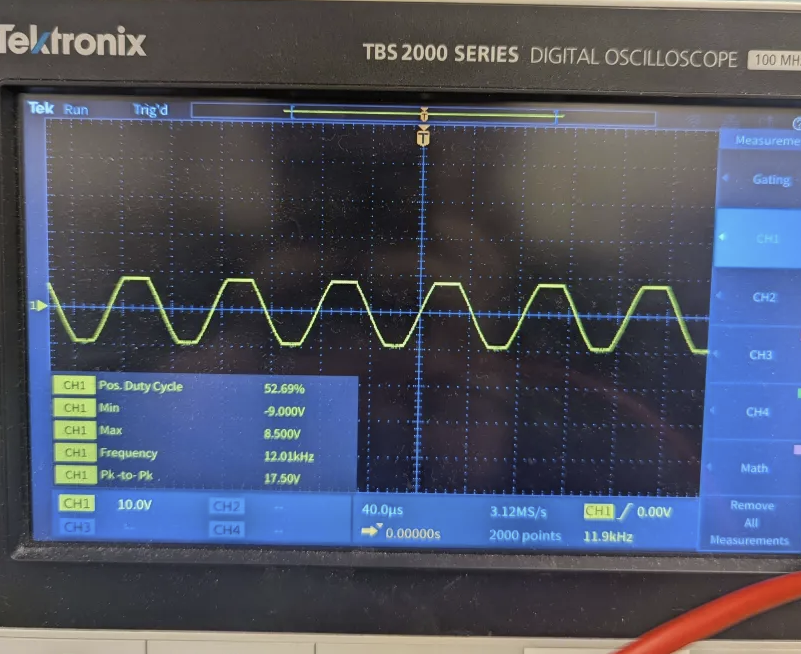

- One worry with this op amp based voltage gain stage is that there may be some frequency limitation. But since our ICL chip can only go up to about 12kHz anyway, we don't run into any issues there, which is great! Next week, we plan to perhaps test driving a speaker with the circuit we currently have. Then, we may add a feature or two to the circuit, like a DC offset or something else. We have also been brainstorming ways of controlling the amplitude of the final wave and the frequency of the final wave in a more intuitive, predictable way for the user, and we may try to implement something there if we find we have the time.